# Where To Sell Products - Transformers version

This notebook contains the logic to characterize geographic areas exploiting user generated content in the form of text messages.

## Prepare tweet data

We have twitter data from July to September 2013 for all the world. However, we only have tagged tweets from Los Angeles in the same time period, so we can only train a classifier with that sub set and apply it to the rest.

In [1]:
import os

artifacts_path = os.path.join(os.path.curdir, 'artifacts/')
models_path = os.path.join(artifacts_path, 'models/')
sklearn_models = os.path.join(models_path, 'sklearn/')
kears_modesl = os.path.join(models_path, 'keras/')
results_path = os.path.join(artifacts_path, 'results/')
logs_path = os.path.join(results_path, 'logs/')
data_path = os.path.join(artifacts_path, 'data/')

In [2]:
import pandas as pd
import os

base_path = "/media/ohtar10/Adder-Storage/datasets/twitter/2013/"
# All tweets (contains tweets from July to September 2013)
raw_tweets = pd.read_parquet(os.path.join(base_path, 'full'), engine='pyarrow')
# Los Angeles tweets
la_tweets = raw_tweets.loc[raw_tweets['place_name'] == "Los Angeles"]
# Labels for LA tweets
tweet_labels = pd.read_parquet(os.path.join(base_path, 'labeling-completed/tweet-labels.parquet'), engine='pyarrow')

#### Here are the LA tweets

In [3]:
la_tweets = la_tweets.set_index('id')
la_tweets.head()

,tweet,lang,favorite_count,retweet_count,is_retweet,user_id,user_name,user_followers_count,user_following_count,user_location,...,place_name,place_full_name,country,country_code,place_type,place_url,hour,year,month,day
id,,,,,,,,,,,,,,,,,,,,,
384916747477741568,En route 2 Jakarta for a show w @karminmusic @...,en,0.0,0.0,0.0,93526496,mikafineo,827.0,306.0,Los Angeles,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,0,2013,10,1
384916885872984065,There should be school tomorrow.,en,0.0,0.0,0.0,45670723,Arjun_Multani,83.0,79.0,,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,0,2013,10,1
384917057852043264,@rhud88 I can honestly say I have no idea when...,en,0.0,0.0,0.0,226453903,mardyballin,553.0,196.0,,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,0,2013,10,1
384916520993714176,So excited for tomorrow @AriShaffir @joerogan ...,en,0.0,0.0,0.0,383386931,SusiePlascencia,577.0,477.0,Los Angeles,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,0,2013,10,1
384919230505701377,Kiss my forehand #SoIKnowItsReal 😂,en,0.0,0.0,0.0,269026097,brandonxsanchez,711.0,519.0,Los Angeles,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,0,2013,10,1


#### And their corresponding labels

In [4]:
tweet_labels = tweet_labels.set_index('id')
tweet_labels.head()

,tweet,category,other
id,,,
383319220961828867,english boy writes with his notebook positione...,other_topic,writing ways
383294856249888768,"The girls i talk to are like the jobs i get, i...",other_topic,relationships
383099313616060416,This I'd what sister are for. @ jolly-hill htt...,na,None
383357888271360000,UOENO,na,None
383358030852550657,@russmillerdrums thanks for taking time to tal...,na,None


So now we can join them and have a tagged data frame of LA tweets

In [5]:
tweets = tweet_labels.loc[:, ['category', 'other']].join(la_tweets, on='id', how='inner')
tweets.head()

,category,other,tweet,lang,favorite_count,retweet_count,is_retweet,user_id,user_name,user_followers_count,...,place_name,place_full_name,country,country_code,place_type,place_url,hour,year,month,day
id,,,,,,,,,,,,,,,,,,,,,
383319220961828867,other_topic,writing ways,english boy writes with his notebook positione...,en,0.0,0.0,0.0,188512561,Normuffin,243.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,14,2013,9,26
383294856249888768,other_topic,relationships,"The girls i talk to are like the jobs i get, i...",en,0.0,0.0,0.0,1444304432,ramirezjerson23,87.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,13,2013,9,26
383099313616060416,na,None,This I'd what sister are for. @ jolly-hill htt...,en,0.0,0.0,0.0,105921479,NaniJolly,13.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,0,2013,9,26
383357888271360000,na,None,UOENO,pt,0.0,0.0,0.0,233651062,Shawwa24,149.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,17,2013,9,26
383358030852550657,na,None,@russmillerdrums thanks for taking time to tal...,en,0.0,0.0,0.0,25229033,AustinElrod4,270.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,17,2013,9,26


## Category distribution

Let's observe the category distribution of this data set

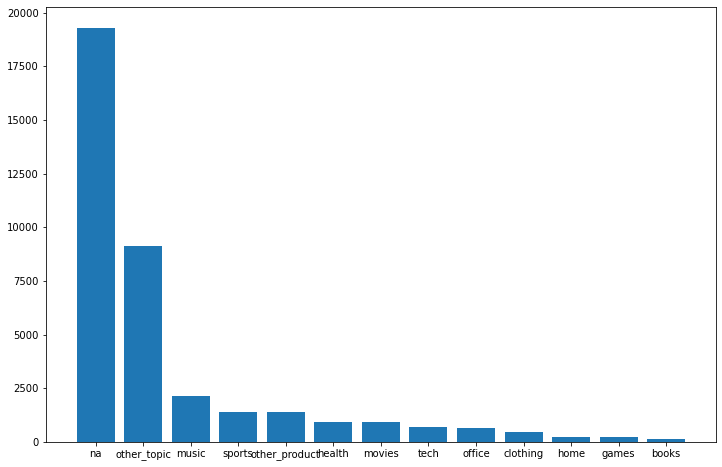

In [6]:
import matplotlib.pyplot as plt

categories = tweets['category'].str.split(',').explode().apply(lambda value: value.strip() if isinstance(value, str) else value).value_counts()
plt.figure(figsize=(12, 8))
plt.bar(categories.index, categories)
plt.show()


It seems we have a heavily unbalance data set. However, from the tagging definition, we know that the ones categorized with 'na' means that the message do not carry enough or useful information, so we can simply discard them. Furthermore, 'other_topic' is meant to be about topics not strictly related to commerce products, so we can discard this category as well. This will leave us with eleven categories, let's see how this shows then.

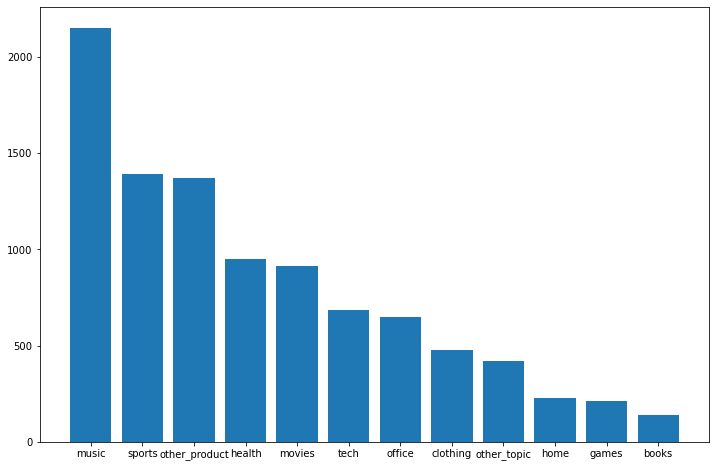

In [7]:
filters = ["home", "office", "music", "health", "tech", "clothing", "games", "books", "movies", "sports", "other_product"]

def category_match(string, filters):
    categories = string.split(',')
    categories = [c.strip() for c in categories]
    if set(categories).intersection(filters):
        return True
    return False

tweets = tweets.loc[tweets['category'].apply(category_match, args=[filters])]

categories = tweets['category'].str.split(',').explode().apply(lambda value: value.strip() if isinstance(value, str) else value).value_counts()
plt.figure(figsize=(12, 8))
plt.bar(categories.index, categories)
plt.show()

We still have an unbalanced data set, but looks much better than before, so this will be our data set for training.

In [8]:
tweets.shape

(8691, 30)

In [9]:
total = tweets.shape[0]
music = categories['music']
print(f"Baseline: {music/total:.2f}")

Baseline: 0.25


## Visualize the tweets in a map

First, we need to parse the geometries informed in each tweet.

In [9]:
from shapely import wkt
import geopandas as gpd

# Some tweets might have appear without place or location geometry
tweets = tweets[(tweets.place_geometry.notnull()) | (tweets.location_geometry.notnull())]

def parse_geometry(geom):
    if geom:
        return wkt.loads(geom)
    else:
        return None

tweets.location_geometry = tweets.location_geometry.apply(parse_geometry)
tweets.place_geometry = tweets.place_geometry.apply(parse_geometry)

# Let's work first with the location geometry first
geo_tweets = gpd.GeoDataFrame(tweets, geometry='location_geometry')
geo_tweets.head()

,category,other,tweet,lang,favorite_count,retweet_count,is_retweet,user_id,user_name,user_followers_count,...,place_name,place_full_name,country,country_code,place_type,place_url,hour,year,month,day
id,,,,,,,,,,,,,,,,,,,,,
383430944650055680,sports,None,#WeLoveLA Pat Haden meets with NCAA to seek ea...,en,0.0,0.0,0.0,748959852,LosAngelesSRH,200.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,22,2013,9,26
383303035138482176,tech,None,I had like perfect internet service and then i...,en,0.0,0.0,0.0,188512561,Normuffin,243.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,13,2013,9,26
383292826219335681,music,None,Oh! Got it :) “@_R0YAL_: @cy_dieyi d legoo is ...,en,0.0,0.0,0.0,70805633,CY_Dieyi,813.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,13,2013,9,26
383322559640379392,music,None,We were us is my song right now !❤️❤️❤️❤️❤️❤️❤️,en,0.0,0.0,0.0,54985237,Katiee_Clinton,525.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,15,2013,9,26
383368197853810688,games,None,“@justincepriano: I don't understand how peopl...,en,0.0,0.0,0.0,1600349232,Frisco_Shazeh,32.0,...,Los Angeles,"Los Angeles, CA",United States,US,city,https://api.twitter.com/1.1/geo/id/3b77caf94bf...,18,2013,9,26


Then, we define a folium function to visualize a heatmap of the tweets in Los Angeles

In [10]:
import folium 
from folium.plugins import HeatMap
import numpy as np

def display_heatmap(center, zoom, geom, radius=20, blur=10, records=-1, random_state=1234):
    if records < 0:
        point_list = [(p.y, p.x) for p in geom.values if p]
    else:
        np.random.seed(random_state)
        indices = np.random.permutation(records)
        point_list = [(p.y, p.x) for p in geom.iloc[indices].values if p]
    
    heatmap = HeatMap(point_list,
                     radius=radius,
                     blur=blur)
    
    m = folium.Map(location=center,
                  zoom_start=zoom,
                  tiles="OpenStreetMap")

    heatmap.add_to(m)
    return m

In [11]:
la_heatmap = display_heatmap(center=(34.1, -118.4),
               zoom=11,
               geom=tweets['location_geometry'].iloc[:1000])
la_heatmap

Now, let's visualize the tweets as individual points with a different color per category

In [12]:
from itertools import cycle
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

def display_elements_on_map(tweets, labels):
    n_labels = len(labels)
    colormap = cycle(plt.cm.rainbow(np.linspace(0, 1, n_labels)))
    colors = {label: matplotlib.colors.to_hex(next(colormap)) for label in labels}
    
    m = folium.Map(location=(34.1, -118.4), 
                zoom_start=11,
                tiles="OpenStreetMap", prefer_canvas=True)
    
    def create_marker(row):
        lat_lon = (row["location_geometry"].y, row["location_geometry"].x)
        label = row["category"]
        color = colors[label] if label in colors else '#000000'

        tooltip = folium.map.Tooltip(text=row.category,
                                    style="color: DodgerBlue")
        folium.CircleMarker(
            location=lat_lon,
            radius=3,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.5,
            stroke=False,
            tooltip=tooltip).add_to(m)
    
    tweets.apply(create_marker, axis=1)
    
    return m

la_cl_map = display_elements_on_map(tweets.loc[tweets['location_geometry'].notnull()], filters)
la_cl_map

Looks good! Now, let's perform the geospatial clustering

### Select the best Hyperparameters for DBSCAN

Resource: https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc

The most important parameters in DBSCAN are:
* Epsilon (eps): The maxmun distance between points to be considered neighbors.
* min_samples: The minimum number of instances for them to be considered as a cluster.

We need to validate what are the best values for these properties. For this, we need to train the model several times with different option values and track the results to finally observe what is the best combination.

First, let's visualize the points as they are to have an idea of the possible value for $k$ i.e., the number of neighbors for the cluster.

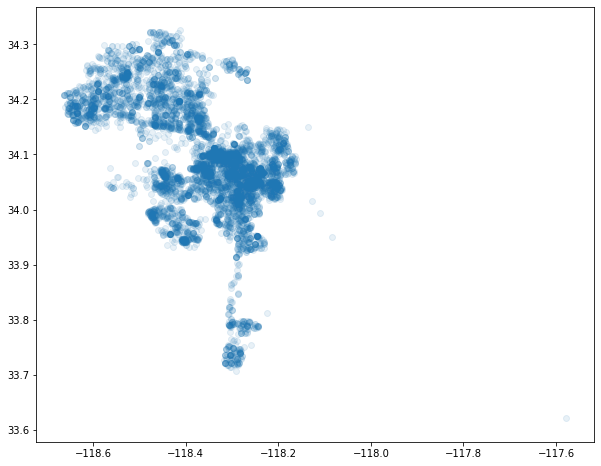

In [13]:
import numpy as np

points = tweets.loc[tweets['location_geometry'].notnull()]['location_geometry'].apply(lambda p: [p.x, p.y])
points = np.array(points.values.tolist())
points.shape

plt.figure(figsize=(10, 8))
plt.scatter(points[:, 0], points[:, 1], alpha=0.1)
plt.show()

We can observe small groups of points, though they are do not seem very well defined. We should not pick a value too high for $k$, hence let's continue with $k=5$.

Now, let's evaluate what is the best value for $eps$.

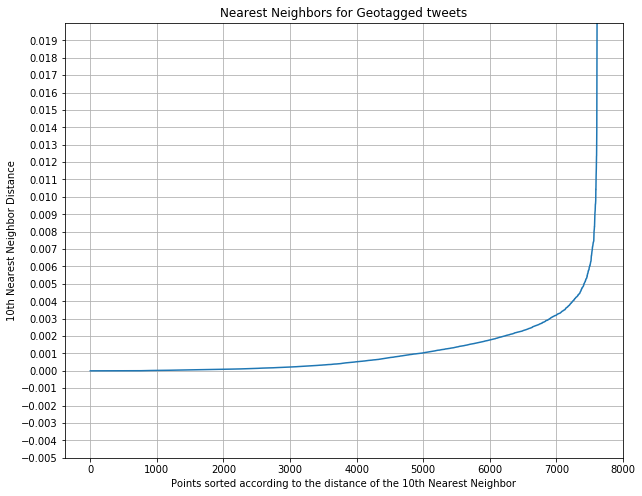

CPU times: user 600 ms, sys: 12.6 ms, total: 613 ms
Wall time: 623 ms


In [14]:
%%time

from sklearn.neighbors import NearestNeighbors

def plot_nearest_neighbors(X, n_neighbors=2):
    neigh = NearestNeighbors(n_neighbors=n_neighbors)
    nbrs = neigh.fit(X)
    distances, indices = nbrs.kneighbors(X)
    distances = np.sort(distances, axis=0)
    distances = distances[:,1]
    
    plt.figure(figsize=(10, 8))
    plt.grid()
    axes = plt.gca()
    axes.set_ylim([-0.005, 0.02])
    plt.yticks(np.arange(-0.005, 0.02, 0.001))
    plt.title("Nearest Neighbors for Geotagged tweets")
    plt.ylabel(f"{n_neighbors}th Nearest Neighbor Distance")
    plt.xlabel(f"Points sorted according to the distance of the {n_neighbors}th Nearest Neighbor")
    plt.plot(distances)
    plt.show()

plot_nearest_neighbors(points, 10)

According to the Nearest Neighbor analysis, for `k=10` the best distance would be $0.004$. Let's use these values as eps.

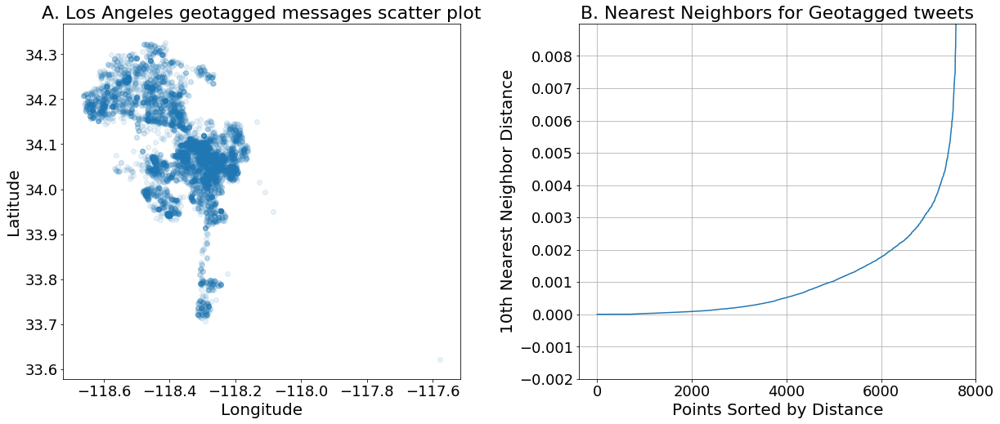

In [15]:
base_fontsize = 18
title_fontsize = base_fontsize + 4
labels_fontsize = base_fontsize + 2
ticks_fontsize = base_fontsize

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
plt.subplots_adjust(wspace=0.3)
#fig.tight_layout()
axs = axs.flatten()

# Scatter plot
axs[0].scatter(points[:, 0], points[:, 1], alpha=0.1)
axs[0].set_title("A. Los Angeles geotagged messages scatter plot", fontsize=title_fontsize)
axs[0].tick_params(labelsize=ticks_fontsize)
axs[0].set_xlabel("Longitude", fontsize=labels_fontsize)
axs[0].set_ylabel("Latitude", fontsize=labels_fontsize)

# Nearest neighbors
n_neighbors = 10
neigh = NearestNeighbors(n_neighbors=n_neighbors)
nbrs = neigh.fit(points)
distances, indices = nbrs.kneighbors(points)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

axs[1].grid()
axs[1].set_ylim([-0.002, 0.009])
axs[1].set_yticks(np.arange(-0.002, 0.009, 0.001))
axs[1].tick_params(labelsize=ticks_fontsize)
axs[1].set_title("B. Nearest Neighbors for Geotagged tweets", fontsize=title_fontsize)
axs[1].set_ylabel(f"{n_neighbors}th Nearest Neighbor Distance", fontsize=labels_fontsize)
axs[1].set_xlabel(f"Points Sorted by Distance", fontsize=labels_fontsize)
axs[1].plot(distances)

In [10]:
%%time
from sklearn.cluster import OPTICS
from sklearn import metrics
import pickle

optics_path = os.path.join(sklearn_models, 'optics.pkl')
optics = None
if os.path.exists(optics_path):
    with open(optics_path, 'rb') as file:
        optics = pickle.load(file)
else:
    optics = OPTICS(cluster_method="dbscan",
                    eps=0.004,
                    min_samples=10,
                    metric="minkowski",
                    n_jobs=-1).fit(points)
    with open(optics_path, 'wb') as file:
        pickle.dump(optics, optics_path)

CPU times: user 228 ms, sys: 15.7 ms, total: 244 ms
Wall time: 243 ms


Let's calculate some metrics

In [17]:
from sklearn import metrics

la_clusters = optics
labels = la_clusters.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('#' * 20)
print('Including the noise')
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(points, labels))
print('#' * 20)
print('Excluding the noise')
qpoints, qlabels = list(zip(*[(p, l) for p, l in zip(points, labels) if l != -1]))
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(qpoints, qlabels))

####################
Including the noise
Estimated number of clusters: 116
Estimated number of noise points: 3366
Silhouette Coefficient: -0.217
####################
Excluding the noise
Silhouette Coefficient: 0.335


And now, let's plot the clusters on a map

In [18]:
from itertools import cycle
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

def display_clusters_on_map(tweets, clusters):
    tweets["cluster"] = clusters
    n_clusters = np.unique(clusters).shape[0]
    colormap = cycle(plt.cm.rainbow(np.linspace(0, 1, n_clusters)))
    colors = {k: matplotlib.colors.to_hex(next(colormap)) for k in range(n_clusters)}
    colors[-1] = '#000000'
    
    m = folium.Map(location=(34.1, -118.4), 
                zoom_start=11,
                tiles="OpenStreetMap", prefer_canvas=True)
    
    def create_marker(row):
        lat_lon = (row["location_geometry"].y, row["location_geometry"].x)
        cluster = row["cluster"]
        color = colors[cluster]

        tooltip = folium.map.Tooltip(text=cluster,
                                    style="color: DodgerBlue")

        folium.CircleMarker(
            location=lat_lon,
            radius=3,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.5 if cluster != -1 else 0.15,
            stroke=False,
            tooltip=tooltip).add_to(m)
    
    tweets.apply(create_marker, axis=1)
    
    return m

la_cl_map = display_clusters_on_map(tweets[tweets['location_geometry'].notnull()], la_clusters.labels_)
la_cl_map

Looks godd! Now for the category prediction

# Tweets product category prediction
Here we are going to train the product classifier model to predict a relationship between the clusters and the products and give a characteristic to the geographic clusters found.

## Tweet Pre-processing
First, we need to pre-process the tweets we have available for classification. This means the cleaning and tokenization of words using the trained dictionary we have from the reviews classifier.


In [10]:
from sklearn.base import BaseEstimator, TransformerMixin
from nltk.tokenize import RegexpTokenizer
import pickle
import re

class DocumentTokenizer(BaseEstimator, TransformerMixin):

    def __init__(self, corpus_column: str, 
                lowercase: bool = True,
                maxlen=None,
                word_index=None,
                split_regex=r'\s+',
                clean_regex=r"[?!\(\)\"'#@\$%\^&\*\-\_|+=\[\{\}\],\.\?/<>~¿]"):
        self.corpus_column = corpus_column
        self.lowercase = lowercase
        self.maxlen = maxlen
        self.word_index = word_index
        self.split_regex = split_regex
        self.clean_regex = clean_regex

    def fit(self, X, y=None):
        return self # Do nothing

    def transform(self, X, y=None):
        def tokenize(row):
            words = re.split(self.split_regex, row[self.corpus_column].lower())
            words = [re.sub(self.clean_regex, '', word) for word in words]
            words = [word.strip() for word in words if len(word.strip()) > 0]
            tokens = [self.word_index[w] for w in words if w in self.word_index][:self.maxlen]
            return [0] * (self.maxlen - len(tokens)) + tokens
        
        return X.apply(tokenize, axis=1, result_type='expand').values

#### Important
For tweet classification we have only 8000 tweets, so we need to do data augmentation in order to get bigger data set.

In [11]:
# augmented_tweets = pd.read_parquet(os.path.join(artifacts_path, 'tweets/all_tweets.parquet'))
emb_insert = pd.read_parquet(os.path.join(artifacts_path, 'tweets/tweets_emb_insert.parquet'))
emd_subs = pd.read_parquet(os.path.join(artifacts_path, 'tweets/tweets_emb_subs.parquet'))
ctx_insert = pd.read_parquet(os.path.join(artifacts_path, 'tweets/tweets_ctx_insert_aug.parquet'))
ctx_subs = pd.read_parquet(os.path.join(artifacts_path, 'tweets/tweets_ctx_substitute_aug.parquet'))
ctx_sent = pd.read_parquet(os.path.join(artifacts_path, 'tweets/tweets_ctx_sent_aug.parquet'))

augmented_tweets = pd.concat([tweets, emb_insert, emd_subs, ctx_insert, ctx_subs, ctx_sent])

augmented_tweets = augmented_tweets[augmented_tweets['tweet'].notna()]

In [12]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(augmented_tweets, test_size=0.2, random_state=4321)
dev, test = train_test_split(test, test_size=0.5, random_state=4321)

In [13]:
import pickle 

word_index_path = os.path.join(data_path, 'word_index.pkl')
with open(word_index_path, 'rb') as file:
    word_index = pickle.load(file)

In [14]:
%%time
tokenizer = DocumentTokenizer('tweet', maxlen=300, word_index=word_index)
X_train = tokenizer.transform(train)
X_dev = tokenizer.transform(dev)
X_test = tokenizer.transform(test)

CPU times: user 20.9 s, sys: 560 ms, total: 21.4 s
Wall time: 21.2 s


Now, we need to train a category encoder since this data set has different label names.

In [15]:
from sklearn.preprocessing import MultiLabelBinarizer
import pickle

categories = tweets['category'].apply(lambda cat: [c.strip() for c in cat.split(",")]).values.tolist()

categories_encoder_path = os.path.join(sklearn_models, 'category_encoder_tweets.pkl')
categories_encoder = None
if os.path.exists(categories_encoder_path):
    with open(categories_encoder_path, 'rb') as file:
        categories_encoder = pickle.load(file)
else:
    categories_encoder = MultiLabelBinarizer()
    categories_encoder.fit(categories)
    with open(categories_encoder_path, 'wb') as file:
        pickle.dump(categories_encoder, file)

/home/ohtar10/miniconda3/envs/tf-test/lib/python3.7/site-packages/sklearn/base.py:334: UserWarning: Trying to unpickle estimator MultiLabelBinarizer from version 0.22.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


Now we can obtain the encoded labels for training

In [16]:
categories = train['category'].apply(lambda cat: [c.strip() for c in cat.split(",")]).values.tolist()
y_train = categories_encoder.transform(categories)

categories = dev['category'].apply(lambda cat: [c.strip() for c in cat.split(",")]).values.tolist()
y_dev = categories_encoder.transform(categories)

categories = test['category'].apply(lambda cat: [c.strip() for c in cat.split(",")]).values.tolist()
y_test = categories_encoder.transform(categories)

## Transfer Learning with the reviews classifier

Since we have very few training examples, our best chance to achieve a decent score is to use transfer learning from our reviews model which achieved a good performance. The transformer model already contains trained layers to extract features from review text, now we will transfer that knowledge by freezing those the attention and embedding layers and train a new fully connected model on-top of the attention layers.

In [17]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
    # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        #   tf.config.experimental.set_virtual_device_configuration(
        #         gpu, [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=6144)]
        #   )
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


In [18]:
class MultiHeadSelfAttention(layers.Layer):
    def __init__(self, embed_dim, num_heads=8):
        super(MultiHeadSelfAttention, self).__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        if embed_dim % num_heads != 0:
            raise ValueError(
                f"embedding dimmension = {embed_dim} should be divisible by number of heads = {num_heads}"
            )
        self.projection_dim = embed_dim // num_heads
        self.query_dense = layers.Dense(embed_dim)
        self.key_dense = layers.Dense(embed_dim)
        self.value_dense = layers.Dense(embed_dim)
        self.combine_heads = layers.Dense(embed_dim)

    def attention(self, query, key, value):
        score = tf.matmul(query, key, transpose_b=True)
        dim_key = tf.cast(tf.shape(key)[-1], tf.float32)
        scaled_score = score / tf.math.sqrt(dim_key)
        weights = tf.nn.softmax(scaled_score, axis=-1)
        output = tf.matmul(weights, value)
        return output, weights

    def separate_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.projection_dim))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, inputs):
        # x.shape = [batch_size, seq_len, embedding_dim]
        batch_size = tf.shape(inputs)[0]
        query = self.query_dense(inputs) # (batch_size, seq_len, embed_dim)
        key = self.key_dense(inputs) # (batch_size, seq_len, embed_dim)
        value = self.value_dense(inputs) # (batch_size, seq_len, embed_dim)
        query = self.separate_heads(
            query, batch_size
        ) # (batch_size, num_heads, seq_len, projection_dim)
        key = self.separate_heads(
            query, batch_size
        ) # (batch_size, num_heads, seq_len, projection_dim)
        value = self.separate_heads(
            query, batch_size
        ) # (batch_size, num_heads, seq_len, projection_dim)

        attention, weights = self.attention(query, key, value)
        attention = tf.transpose(
            attention, perm=[0, 2, 1, 3]
        ) # (batch_size, seq_len, embed_dim)
        concat_attention = tf.reshape(
            attention, (batch_size, -1, self.embed_dim)
        ) # (batch_size, seq_len, embed_dim)
        output = self.combine_heads(
            concat_attention
        ) # (batch_size, seq_len, embed_dim)
        return output


In [19]:
class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, dropout_rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = MultiHeadSelfAttention(embed_dim=embed_dim, num_heads=num_heads)
        self.ffn = keras.Sequential(
            [
                layers.Dense(ff_dim, activation='relu'),
                layers.Dense(embed_dim)
            ]
        )
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = layers.Dropout(dropout_rate)
        self.dropout2 = layers.Dropout(dropout_rate)

    def call(self, inputs, training):
        attn_output = self.att(inputs)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(inputs + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        return self.layernorm2(out1 + ffn_output)

In [20]:
class TokenAndPositionEmbedding(layers.Layer):
    def __init__(self, maxlen, vocab_size, embed_dim):
        super(TokenAndPositionEmbedding, self).__init__()
        self.token_emb = layers.Embedding(input_dim=vocab_size, output_dim=embed_dim, mask_zero=True)
        self.pos_emb = layers.Embedding(input_dim=maxlen, output_dim=embed_dim, mask_zero=True)

    def call(self, x):
        maxlen = tf.shape(x)[-1]
        positions = tf.range(start=0, limit=maxlen, delta=1)
        positions = self.pos_emb(positions)
        x = self.token_emb(x)
        return x + positions

Now let's load the base model. This is the reviews classifier that we already trained. The idea is to do a transfer learning by freezing all but the top fully connected layer so we can implement one specifically for the twitter task.

In [21]:
def build_model(path, maxlen, classes):
    # load the base model and freeze it
    base_model = tf.keras.models.load_model(path, compile=False)
    base_model.trainable = False

    inputs = layers.Input(shape=(maxlen,))
    # From the base model, we are going to use the first three layers
    # with the new input layer
    x = base_model.layers[1](inputs)
    x = base_model.layers[2](x)

    # new model
    
    x = layers.Conv1D(128, 5, activation='relu')(x)
    x = layers.MaxPool1D(2, strides=2, padding='valid')(x)

    x = layers.Conv1D(64, 3, activation='relu')(x)
    x = layers.MaxPool1D(2, strides=2, padding='valid')(x)

    # x = layers.Conv1D(64, 3, activation='relu')(x)
    # x = layers.MaxPool1D(2, strides=2, padding='valid')(x)

    x = layers.Flatten()(x)

    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.2)(x)
    # x = layers.Dense(1024, activation='relu')(x)
    # x = layers.Dropout(0.3)(x)
    # x = layers.Dense(512, activation='relu')(x)
    # x = layers.Dropout(0.2)(x)
    # x = layers.Dense(512, activation='relu')(x)
    # x = layers.Dropout(0.2)(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.1)(x)
    x = layers.Dense(256, activation='tanh')(x)
    # x = layers.Dropout(0.1)(x)
    # x = layers.Dense(128, activation='tanh')(x)

    outputs = layers.Dense(classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

keras_model_path = os.path.join(kears_modesl, 'tweets-classifier')
is_twitter_model_trained = False
if os.path.exists(keras_model_path):
    model = tf.keras.models.load_model(keras_model_path)
    is_twitter_model_trained = True
else:
    base_model_path = os.path.join(kears_modesl, 'reviews-classifier')
    model = build_model(base_model_path, 300, y_train.shape[1])

IndexError: list index out of range

Finally, let's define our own fully connected layers for our specific task

In [21]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 300)]             0         
_________________________________________________________________
token_and_position_embedding (None, 300, 128)          128038400 
_________________________________________________________________
transformer_block (Transform (None, 300, 128)          83136     
_________________________________________________________________
conv1d (Conv1D)              (None, 296, 128)          82048     
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 148, 128)          0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 146, 64)           24640     
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 73, 64)            0     

In [22]:
%%time
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint


checkpoints_path = os.path.join(results_path, 'checkpoints/')
logs_path = os.path.join(results_path, 'logs/')
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, min_delta=1e-7, restore_best_weights=True),
    TensorBoard(log_dir=logs_path),
    ModelCheckpoint(checkpoints_path, monitor='val_accuracy')
]

optimizer = Adam(learning_rate=1e-3)


model.compile(optimizer="adam", loss='kullback_leibler_divergence', metrics=['accuracy'])
history = model.fit(X_train, y_train, batch_size=64, epochs=100, validation_data=(X_dev, y_dev), callbacks=callbacks)

Train on 109360 samples, validate on 13670 samples
Epoch 1/100
109184/109360 [============================>.] - ETA: 0s - loss: 1.8014 - accuracy: 0.5169WARNING:tensorflow:Skipping full serialization of Keras model <tensorflow.python.keras.saving.saved_model.load.Sequential object at 0x7fda78fd8090>, because its inputs are not defined.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: ./artifacts/results/checkpoints/assets
109360/109360 [==============================] - 31s 284us/sample - loss: 1.8015 - accuracy: 0.5169 - val_loss: 1.6197 - val_accuracy: 0.5821
Epoch 2/100
109312/109360 [============================>.] - ETA: 0s - loss: 1.4113 - accuracy: 0.6449WARNING:tensorflow:Skipping full serialization of Keras model <tensorflow.python.keras.saving.saved_model.load.Sequential object at 0x7fda78fd8090>, because its inputs are not defined.
INFO:tensorflow:Assets written to: ./artifacts/results/checkpoints/assets
1093

In [23]:
model.evaluate(X_dev, y_dev)

13670/13670 [==============================] - 3s 201us/sample - loss: 1.3194 - accuracy: 0.6757


[1.3193846852219533, 0.67571324]

In [24]:
model.evaluate(X_test, y_test)

13671/13671 [==============================] - 3s 197us/sample - loss: 1.2967 - accuracy: 0.6829


[1.2967493448110254, 0.68290544]

In [32]:
%%time
import numpy as np
from sklearn.metrics import classification_report, accuracy_score

def compute_classification_report(model, X, y):
    y_pred = model.predict(X)
    y_pred_logits = y_pred
    y_pred = np.where(y_pred > 0.5, 1., 0.)

    # compute accuracy score
    acc = accuracy_score(y, y_pred)
    # compute the classification report
    cr = classification_report(y, y_pred)
    return acc, cr
acc, cr = compute_classification_report(model, X_dev, y_dev)

CPU times: user 0 ns, sys: 13 µs, total: 13 µs
Wall time: 18.1 µs


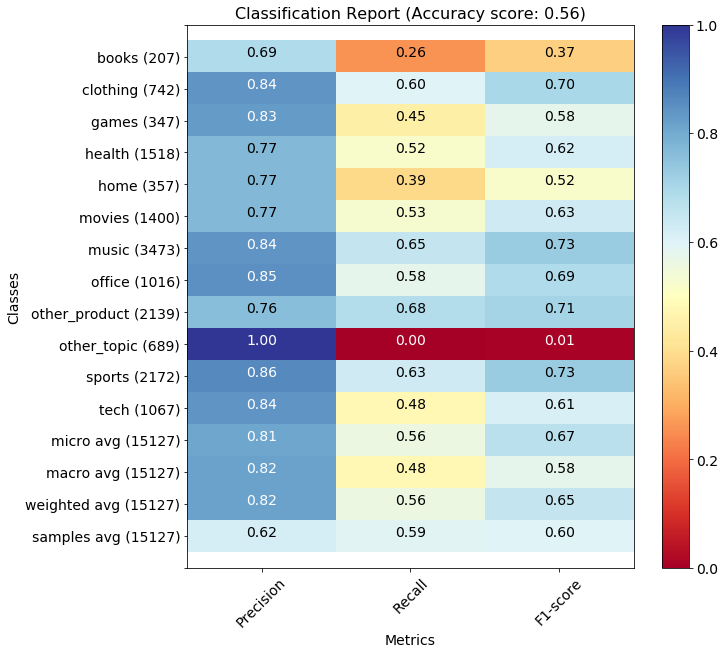

In [27]:
import matplotlib.pyplot as plt
import re
import itertools

def plot_classification_report(title, cr, class_labels):
    cmap="RdYlBu"

    cr = cr.replace("\n\n", "\n")
    cr = cr.replace(" / ", "/")
    lines = cr.split("\n")

    classes, plot_mat, support = [], [], []
    for line in lines[1:]:
        t = re.findall(r'(\s?\w+\s\w+\s?|\s?\d+\.?\d*\s?)', line)
        t = [i.strip() for i in t]
        if len(t) < 2:
            continue

        if t[0].isnumeric():
            cl_id = int(t[0])
            classes.append(class_labels[cl_id])
        else:
            classes.append(t[0])

        v = [float(x) for x in t[1: len(t) - 1]]
        support.append(int(t[-1]))
        plot_mat.append(v)

    plot_mat = np.array(plot_mat)
    x_tick_labels = ["Precision", "Recall", "F1-score"]
    y_tick_labels = [""] + [f"{classes[idx]} ({sup})" for idx, sup in enumerate(support)] + [""]

    plt.figure(figsize=(10, 10))
    plt.title(title, fontsize=16)

    plt.imshow(plot_mat, interpolation="nearest", cmap=cmap, aspect="auto")
    cb = plt.colorbar()
    cb.ax.tick_params(labelsize=14)

    plt.xticks(np.arange(3), x_tick_labels, rotation=45, fontsize=14)
    start = -1
    stop = len(classes) + 1
    y_ticks = np.arange(start, stop, 1)
    plt.yticks(y_ticks, y_tick_labels, fontsize=14)

    upper_threshold = plot_mat.min() + (plot_mat.max() - plot_mat.min()) / 10 * 8
    lower_threshold = plot_mat.min() + (plot_mat.max() - plot_mat.min()) / 10 * 2

    for i, j in itertools.product(range(plot_mat.shape[0]), range(plot_mat.shape[1])):
        text = f"{plot_mat[i, j]:.2f}"
        color = "white" if plot_mat[i, j] > upper_threshold or plot_mat[i, j] < lower_threshold else "black"
        ax = plt.text(j, i, text, fontsize=14,
                        horizontalalignment="center",
                        color=color)

    plt.ylabel("Classes", fontsize=14)
    plt.xlabel("Metrics", fontsize=14)
    plt.show()

class_labels = categories_encoder.classes_
title = f"Classification Report (Accuracy score: {acc:.2f})"
plot_classification_report(title, cr, class_labels)

Let's do a round of fine tunning and make the whole model trainable

In [28]:
model.trainable = True
optimizer = Adam(learning_rate=1e-6)
model.compile(optimizer="adam", loss='kullback_leibler_divergence', metrics=['accuracy'])
history = model.fit(X_train, y_train, batch_size=64, epochs=100, validation_data=(X_dev, y_dev), callbacks=callbacks)

Train on 109360 samples, validate on 13670 samples
Epoch 1/100
109312/109360 [============================>.] - ETA: 0s - loss: 0.8488 - accuracy: 0.8005WARNING:tensorflow:Skipping full serialization of Keras model <tensorflow.python.keras.saving.saved_model.load.Sequential object at 0x7fda78fd8090>, because its inputs are not defined.
INFO:tensorflow:Assets written to: ./artifacts/results/checkpoints/assets
109360/109360 [==============================] - 128s 1ms/sample - loss: 0.8489 - accuracy: 0.8004 - val_loss: 1.0207 - val_accuracy: 0.7578
Epoch 2/100
109312/109360 [============================>.] - ETA: 0s - loss: 0.5731 - accuracy: 0.8712WARNING:tensorflow:Skipping full serialization of Keras model <tensorflow.python.keras.saving.saved_model.load.Sequential object at 0x7fda78fd8090>, because its inputs are not defined.
INFO:tensorflow:Assets written to: ./artifacts/results/checkpoints/assets
109360/109360 [==============================] - 128s 1ms/sample - loss: 0.5731 - accu

In [29]:
model.evaluate(X_dev, y_dev)

13670/13670 [==============================] - 3s 200us/sample - loss: 0.9125 - accuracy: 0.7906


[0.9125238865940957, 0.7906364]

In [30]:
model.evaluate(X_test, y_test)

13671/13671 [==============================] - 3s 197us/sample - loss: 0.8993 - accuracy: 0.7953


[0.8993228694845925, 0.7953332]

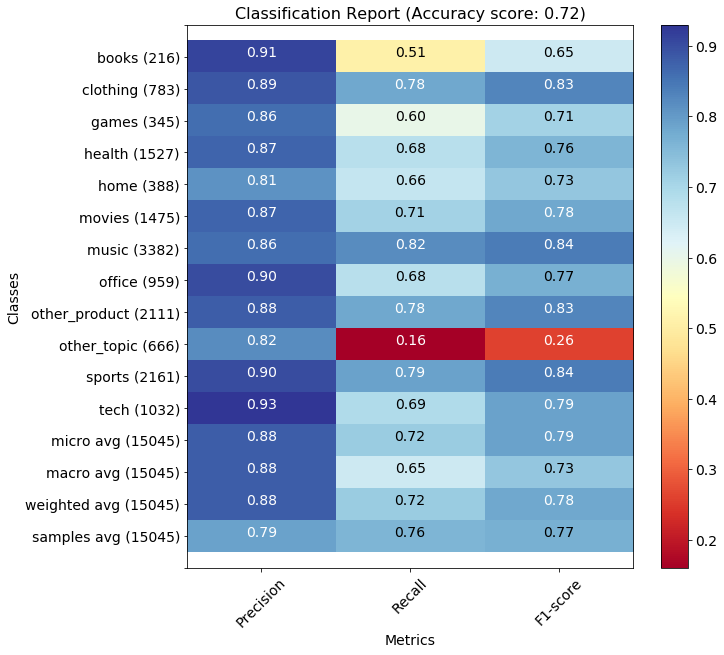

In [33]:
acc, cr = compute_classification_report(model, X_test, y_test)
class_labels = categories_encoder.classes_
title = f"Classification Report (Accuracy score: {acc:.2f})"
plot_classification_report(title, cr, class_labels)

In [34]:
model.save(os.path.join(kears_modesl, 'tweets-classifier'))

INFO:tensorflow:Assets written to: ./artifacts/models/keras/tweets-classifier/assets


Let's do some error analysis and try to understand where the model is failing.

In [36]:
errors = [not np.array_equal(y_t, y_p) for y_t, y_p in zip(y_dev, y_pred)]
X_error = X_dev[errors]
y_error = y_pred[errors]
y_error_logits = np.round(y_pred_logits[errors], decimals=2)
tweets_error = dev[errors][['tweet', 'category']]
tweets_error['predicted'] = categories_encoder.inverse_transform(y_error)
tweets_error['pred_logits'] = y_error_logits.tolist()
tweets_error.loc[:, 'pred_logits'] = tweets_error.loc[:, 'pred_logits'].apply(lambda logits: [round(l, 2) for l in logits])

In [37]:
categories_encoder.classes_

array(['books', 'clothing', 'games', 'health', 'home', 'movies', 'music',
       'office', 'other_product', 'other_topic', 'sports', 'tech'],
      dtype=object)

In [38]:
tweets_error

,tweet,category,predicted,pred_logits
19951,Guys need to judge themselves on how much they...,"movies,music",(),"[0.01, 0.24, 0.01, 0.03, 0.01, 0.12, 0.36, 0.0..."
23269,maybe i must fuck fat hoes like adele ahaha,music,(),"[0.0, 0.0, 0.0, 0.2, 0.0, 0.02, 0.49, 0.01, 0...."
10695,@ MRxFlores longest tenure Lisa of Odd concaca...,sports,(),"[0.03, 0.01, 0.05, 0.02, 0.0, 0.06, 0.14, 0.03..."
1871,@ i _ b you okay?,health,(),"[0.01, 0.03, 0.02, 0.12, 0.01, 0.08, 0.33, 0.0..."
13105,@ esquibelderek I feel you. My Aunt_Maude only...,health,(),"[0.02, 0.02, 0.01, 0.25, 0.01, 0.25, 0.18, 0.0..."
...,...,...,...,...
7193,possum If Wiemer I ever got a follow CCI from ...,music,"(clothing,)","[0.0, 0.63, 0.01, 0.01, 0.0, 0.04, 0.15, 0.01,..."
22333,Now time to read c; p: 1–18 on our computer or...,books,"(tech,)","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.01..."
20818,@ hillelaron llc your 2010 online nt article h...,books,(),"[0.03, 0.01, 0.0, 0.03, 0.0, 0.1, 0.08, 0.28, ..."
13784,i'metres not heading back tomorrow this coach ...,"health, sports","(sports,)","[0.0, 0.0, 0.0, 0.21, 0.0, 0.0, 0.01, 0.01, 0...."
